In [1]:
# Uncoomment as needed. Downloads dependencies.

# downloads requirements inside this environment
# %pip install -r requirements.txt

# downloads requirements into the PC itself
# !pip install -r requirements.txt

In [2]:
import numpy as np
import pandas as pd
import itertools
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
hbnd_df = pd.read_csv("./src/h_bnd.csv")
sasa_ub_df = pd.read_csv("./src/sasa_unbnd.csv")
otw_binding_df = pd.read_csv("./src/otw_binding.csv")
sasa_bnd_df = pd.read_csv("./src/sasa_bnd.csv")
sasa_bndwh_df = pd.read_csv("./src/sasa_bnd_whole.csv")
sasa_bnd_fcc_df = pd.read_csv("./src/sasa_bnd_fcc.csv")

In [4]:
scaler = StandardScaler()
scaled_hbnd = scaler.fit_transform(hbnd_df)
scaled_hbnd

array([[ 0.1998679 ,  0.51571062,  0.47909349, ..., -0.34425764,
        -0.10020471,  0.53586983],
       [ 1.10835835, -2.37226887, -0.39649116, ...,  0.38397968,
        -0.10020471,  1.38991238],
       [ 1.10835835, -0.92827912,  0.47909349, ..., -0.34425764,
                nan, -0.31817271],
       ...,
       [ 0.1998679 , -0.92827912, -1.27207581, ..., -1.07249496,
        -0.8588975 ,         nan],
       [ 0.1998679 ,  0.51571062, -2.14766045, ..., -0.34425764,
         1.41718088,  1.38991238],
       [-0.70862255, -0.92827912,  0.47909349, ..., -0.34425764,
        -1.61759029,  0.53586983]])

In [5]:
sc_hbnd_df = pd.DataFrame(scaled_hbnd)
sc_hbnd_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.199868,0.515711,0.479093,-0.220779,0.275380,1.166667,0.300150,-0.452187,-0.351095,0.870186,1.347928,0.272195,1.056806,1.228769,0.473118,1.468919,NaN,-0.344258,-0.100205,0.535870
1,1.108358,-2.372269,-0.396491,0.482954,0.275380,-0.722222,1.125563,-1.186990,1.161314,0.085592,-0.646267,0.272195,-0.764152,-0.296600,0.473118,-1.303872,NaN,0.383980,-0.100205,1.389912
2,1.108358,-0.928279,0.479093,-1.628245,0.275380,-0.722222,0.300150,1.752224,-0.351095,0.870186,1.347928,-1.821615,0.146327,0.466085,-0.545906,0.544655,0.473804,-0.344258,NaN,-0.318173
3,-0.708623,-0.206284,-0.396491,-0.924512,1.303466,-0.722222,1.125563,1.017420,1.917519,0.870186,0.350831,NaN,1.967285,-0.296600,-0.545906,-1.303872,0.473804,-0.344258,-0.100205,1.389912
4,1.108358,-0.206284,-0.396491,-0.220779,0.275380,0.222222,-0.525263,-0.452187,-0.351095,0.870186,NaN,-1.821615,-1.674631,1.228769,0.473118,-0.379608,0.473804,1.112217,-0.100205,-1.172215


In [6]:
print(sc_hbnd_df.max())
print(sc_hbnd_df.min())

0     2.016849
1     1.959700
2     2.230263
3     1.890420
4     2.331551
5     2.111111
6     1.950976
7     2.487027
8     1.917519
9     1.654781
10    2.345026
11    2.366006
12    1.967285
13    1.991454
14    2.511167
15    1.468919
16    2.369018
17    1.840454
18    2.175874
19    1.389912
dtype: float64
0    -2.525603
1    -3.094264
2    -2.147660
3    -3.035710
4    -2.808877
5    -2.611111
6    -3.001501
7    -3.391401
8    -2.619709
9    -2.268191
10   -2.640463
11   -1.821615
12   -3.495588
13   -3.347337
14   -2.583955
15   -2.228135
16   -2.369018
17   -3.257207
18   -3.134976
19   -2.880300
dtype: float64


In [7]:
print(hbnd_df.max())
print(hbnd_df.min())

ALA    11.0
ARG    11.0
ASN    11.0
ASP    11.0
CYS    11.0
GLU    11.0
GLN    11.0
GLY    12.0
HIS    11.0
ILE    11.0
LEU    11.0
LYS    11.0
MET    11.0
PHE    11.0
PRO    11.0
SER    10.0
THR    11.0
TRP    11.0
TYR    11.0
VAL    10.0
dtype: float64
ALA    6.0
ARG    4.0
ASN    6.0
ASP    4.0
CYS    6.0
GLU    6.0
GLN    5.0
GLY    4.0
HIS    5.0
ILE    6.0
LEU    6.0
LYS    7.0
MET    5.0
PHE    4.0
PRO    6.0
SER    6.0
THR    6.0
TRP    4.0
TYR    4.0
VAL    5.0
dtype: float64


In [8]:
scaled_sasa_ub = scaler.fit_transform(sasa_ub_df)
scaled_sasa_ub

array([[ 0.44138388, -0.83535459, -1.11184892, ..., -0.60373679,
        -0.72173074, -1.4032988 ],
       [-0.49125806, -0.25749923, -1.05229791, ...,  0.0582753 ,
        -0.52096197,  0.17202867],
       [ 1.39635769,  1.71167616,  1.7429591 , ..., -0.18657916,
                nan, -0.10252518],
       ...,
       [-0.88502456, -1.22079611,  1.71724493, ..., -1.07572023,
         0.36140284,         nan],
       [ 0.27656127,  0.9566585 ,  0.2880392 , ..., -0.26727636,
        -0.21800088,  0.456906  ],
       [ 1.64465365,  1.36200721,  1.0797983 , ...,  1.9308184 ,
         2.90517149,  1.567997  ]])

In [9]:
sc_sasa_ub_df = pd.DataFrame(scaled_sasa_ub)
sc_sasa_ub_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.441384,-0.835355,-1.111849,-1.919606,-0.605410,-1.118416,-1.216699,-0.334828,-0.766414,-0.829482,-0.316460,-0.683671,NaN,-0.950283,-0.083965,-0.360104,-0.510945,-0.603737,-0.721731,-1.403299
1,-0.491258,-0.257499,-1.052298,-0.584169,0.704927,-1.329820,-0.829858,-1.624188,-0.864299,1.250216,-1.172094,0.238264,-0.322382,-0.917248,-1.576561,-0.138436,NaN,0.058275,-0.520962,0.172029
2,1.396358,1.711676,1.742959,1.133086,0.718241,-0.035871,3.937579,0.336038,-1.415303,1.210541,-0.299045,1.146584,1.702432,-0.662056,-0.793486,-0.520878,-0.410785,-0.186579,NaN,-0.102525
3,-0.802705,-0.513096,0.885495,0.810723,-0.630501,-1.437084,-1.190185,2.178055,-1.236438,1.956218,-0.440269,NaN,-0.161490,-0.345109,-0.023059,1.046520,0.703706,-0.145533,1.474733,-0.412002
4,-1.543321,-0.652125,0.102321,0.204055,1.416039,0.121732,-0.493913,0.548179,0.446072,0.094693,NaN,-1.498957,0.120764,-0.097414,0.280350,-1.995284,1.967145,-1.270297,0.865505,2.401294


In [10]:
#sasa_bnd_df = sasa_bnd_df.iloc[:, 1:-1]
sasa_bnd_df.head()

,ALA,ARG,ASN,ASP,CYS,GLU,GLN,GLY,HIS,ILE,LEU,LYS,MET,PHE,PRO,SER,THR,TRP,TYR,VAL
0,3021.536621,3144.528809,3074.209961,3089.358154,3147.086670,3188.895752,3225.294434,3116.558105,3185.936768,3167.329102,3222.031738,3155.372314,3235.078125,3177.545410,3189.553467,3164.505127,NaN,3142.773926,3170.345703,3146.637207
1,3212.853271,3269.848145,3188.226318,3118.199219,3120.187988,3223.502197,3172.688721,3169.795166,3192.484375,3182.640381,3246.260986,3409.857178,3239.344238,3183.604980,3285.399414,3240.848633,NaN,3230.986572,3321.089600,3117.419678
2,3114.270264,3154.209473,3160.346436,3263.613037,3258.334961,3157.910156,3202.566162,3302.836670,3221.173828,3348.243408,3152.132568,3098.444092,3367.024414,3231.333008,3252.458984,3169.530273,3198.330566,3072.256104,NaN,3312.014893
3,3224.113037,3134.017578,3128.296631,3188.125732,3119.025146,3153.989990,3174.175293,3149.499268,3245.378174,3149.852783,3169.869629,NaN,3218.083740,3061.395996,3104.155762,3228.522705,3094.011963,3202.609863,3197.997314,3122.395264
4,3106.419434,3112.103271,3084.266113,3088.045166,3166.975830,3116.073730,3117.255371,3211.277832,3043.946289,3052.977295,NaN,3165.277588,3191.004639,3181.317383,3169.155029,3105.623779,3190.784180,3267.276611,3186.772217,3063.746094


In [11]:
scaled_sasa_bnd = scaler.fit_transform(sasa_bnd_df)
scaled_sasa_bnd

array([[-2.25425191, -0.88511475, -1.35006748, ..., -1.01565997,
        -0.46370683, -0.30650671],
       [ 0.62910827,  0.54470797,  0.2529644 , ...,  0.14469415,
         1.60500437, -0.74505311],
       [-0.85665012, -0.77466385, -0.13901743, ..., -1.94325537,
                nan,  2.17576306],
       ...,
       [ 1.90308696, -0.01270251,  0.75108366, ..., -0.67165056,
         0.02135796,         nan],
       [-1.41997081,  1.77471516, -0.61084004, ..., -0.22361622,
         0.08489881,  2.55155894],
       [ 1.73139149, -1.32601306,  1.65150297, ...,  0.67775137,
         0.24214106,  0.95359368]])

In [12]:
sc_sasa_bnd_df = pd.DataFrame(scaled_sasa_bnd)
sc_sasa_bnd_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-2.254252,-0.885115,-1.350067,-1.245031,-0.420769,-0.222357,0.142187,-0.784976,0.146981,-0.358625,0.297344,-0.796653,0.417248,-0.214499,0.050752,-0.166388,NaN,-1.015660,-0.463707,-0.306507
1,0.629108,0.544708,0.252964,-0.875963,-0.751828,0.295769,-0.503050,-0.043123,0.252753,-0.144094,0.638269,2.325390,0.473332,-0.127272,1.355506,0.874863,NaN,0.144694,1.605004,-0.745053
2,-0.856650,-0.774664,-0.139017,0.984842,0.948433,-0.686271,-0.136587,1.810796,0.716209,2.176217,-0.686194,-1.495053,2.151868,0.559767,0.907087,-0.097850,0.608994,-1.943255,NaN,2.175763
3,0.798806,-1.005042,-0.589627,0.018860,-0.766140,-0.744963,-0.484816,-0.325945,1.107212,-0.603490,-0.436619,NaN,0.193832,-1.886455,-1.111769,0.706749,-1.054777,-0.228575,-0.084234,-0.670371
4,-0.974971,-1.255072,-1.208681,-1.261833,-0.175981,-1.312643,-1.182969,0.534933,-2.146767,-1.960840,NaN,-0.675134,-0.162161,-0.160202,-0.226932,-0.969471,0.488637,0.622055,-0.238280,-1.550678


In [13]:
# sasa_bndwh_df = sasa_bndwh_df.iloc[:, 1:-1]

In [14]:
sasa_bndwh_df.head()

,ALA,ARG,ASN,ASP,CYS,GLU,GLN,GLY,HIS,ILE,LEU,LYS,MET,PHE,PRO,SER,THR,TRP,TYR,VAL
0,15013.80566,15187.99805,14995.32129,15091.66895,15360.16602,15147.07520,15234.72559,15060.15527,15141.74805,15168.52148,15205.26270,15288.55469,15372.57129,15318.64551,15108.43262,15275.40625,NaN,15262.05273,15324.79883,15239.16699
1,15550.94434,15718.09277,15178.14941,15216.44922,15300.75977,15211.94238,15104.35254,15187.65723,15316.82129,15337.06152,15189.81445,15497.25586,15382.91504,15322.43262,15443.46777,15275.77148,NaN,15279.24316,15323.65039,15072.27637
2,15099.05957,15240.80469,15552.99219,15404.21484,15363.73535,15204.66016,15308.00098,15371.30469,15188.42773,15186.77637,15060.02930,15391.24023,15350.22070,15271.40723,15200.29688,15120.69043,15362.31250,15081.91699,NaN,15487.28906
3,15226.06250,15434.43848,14903.42383,15355.14355,15021.98730,15100.66699,15160.86914,15250.91406,14991.44238,15107.80078,15061.96875,NaN,15109.74414,15090.02148,15121.12305,15392.16992,15211.03809,15237.51465,15231.09375,15050.98047
4,15129.85449,15144.76953,15119.16895,15161.94043,15263.42480,15221.79004,15211.48926,15408.74902,15333.42773,15032.53027,NaN,15066.71973,15110.49414,15145.00586,15319.52539,15029.32031,15433.24316,15333.58301,15504.08203,15075.31738


In [15]:
scaled_sasa_bndwh = scaler.fit_transform(sasa_bndwh_df)
scaled_sasa_bndwh

array([[-1.63546069e+00, -7.11558792e-01, -1.34249470e+00, ...,
         5.21176546e-04,  4.69154832e-01,  1.28992171e-01],
       [ 2.25351234e+00,  2.85559642e+00, -2.05288082e-01, ...,
         1.31521759e-01,  4.60893109e-01, -9.67781503e-01],
       [-1.01820826e+00, -3.56208185e-01,  2.12626622e+00, ...,
        -1.37221277e+00,             nan,  1.75960361e+00],
       ...,
       [-2.85813155e-01, -6.11526514e-01,  1.47999487e-01, ...,
        -1.29949753e+00,  1.36533915e+00,             nan],
       [-2.01667443e-01,  5.75310616e-01, -8.38042059e-01, ...,
        -4.27658644e-01, -5.35807038e-02,  1.16768496e+00],
       [ 4.58976461e-01, -1.90217130e-01,  1.23042195e+00, ...,
         1.47349817e+00,  5.66812935e-01,  1.15720201e-01]])

In [16]:
sc_sasa_bndwh_df = pd.DataFrame(scaled_sasa_bndwh)
sc_sasa_bndwh_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-1.635461,-0.711559,-1.342495,-1.071414,0.883897,-0.860022,-0.217907,-1.213766,-0.572445,-0.622919,-0.366816,0.073110,0.887094,0.690503,-0.742120,0.284467,NaN,0.000521,0.469155,0.128992
1,2.253512,2.855596,-0.205288,-0.243607,0.434891,-0.279334,-1.332885,-0.270185,0.917969,0.568506,-0.472580,1.449777,0.955344,0.717002,1.552404,0.287242,NaN,0.131522,0.460893,-0.967782
2,-1.018208,-0.356208,2.126266,1.002052,0.910875,-0.344524,0.408759,1.088902,-0.175057,-0.493873,-1.361129,0.750460,0.739621,0.359969,-0.112978,-0.890881,1.078153,-1.372213,NaN,1.759604
3,-0.098686,0.946808,-1.914105,0.676507,-1.672134,-1.275466,-0.849543,0.197949,-1.852010,-1.052159,-1.347851,NaN,-0.847085,-0.909219,-0.655209,1.171500,-0.179734,-0.186473,-0.204947,-1.107734
4,-0.795248,-1.002456,-0.572152,-0.605225,0.152705,-0.191178,-0.416629,1.366009,1.059341,-1.584253,NaN,-1.390194,-0.842136,-0.524484,0.703571,-1.585004,1.667961,0.545621,1.758894,-0.947797


In [17]:
sasa_bnd_fcc_df.head()

,ALA,ARG,ASN,ASP,CYS,GLU,GLN,GLY,HIS,ILE,LEU,LYS,MET,PHE,PRO,SER,THR,TRP,TYR,VAL
0,11949.92871,11966.34863,11849.35645,11925.65820,12147.55469,11838.21387,11931.76367,11891.45215,11883.13281,11902.04785,11882.67285,12041.11426,12068.78027,12064.43750,11824.40430,12012.78125,NaN,12036.12012,12048.90625,11986.45703
1,12284.12207,12367.47168,11902.56543,12039.79883,12102.85059,11925.52539,11806.45605,11957.51758,12075.73730,12079.42578,11849.21289,11996.47266,12070.37402,12037.03125,12102.68457,11926.17480,NaN,11969.83789,11909.42578,11860.19043
2,11932.64355,12016.72754,12278.12012,12043.57324,12016.30469,11953.92383,12047.47363,11995.60352,11867.89648,11752.91016,11838.10938,12204.70801,11922.78125,11963.21387,11861.73145,11849.67969,12115.54492,11933.13379,NaN,12094.84961
3,11937.13574,12180.64063,11684.76563,12082.86914,11833.99316,11848.06445,11915.40430,12015.54492,11665.33203,11861.25684,11808.54297,NaN,11779.02539,11921.91406,11913.56152,12070.12695,12029.11133,11931.62500,11926.94727,11876.58008
4,11926.25000,11967.55078,11922.37305,12020.49609,11990.37988,12035.57422,12003.52734,12147.23047,12222.95898,11914.85449,NaN,11827.38281,11843.86426,11890.71484,12051.70508,11851.33496,12208.85742,11998.72949,12225.98047,11914.51758


In [18]:
scaled_sasa_fcc = scaler.fit_transform(sasa_bnd_fcc_df)
scaled_sasa_fcc

array([[-0.33496673, -0.19172553, -0.88631332, ...,  0.79199617,
         0.65303804,  0.12477487],
       [ 2.42121338,  2.98879855, -0.45128285, ...,  0.09045635,
        -0.58608229, -0.91282941],
       [-0.47752197,  0.20773128,  2.61920888, ..., -0.29802466,
                nan,  1.01549819],
       ...,
       [-1.23583509, -0.36865012, -0.26979261, ..., -1.50160782,
         1.53596374,         nan],
       [ 0.41718519, -0.28264627, -0.39816356, ...,  0.13120113,
        -0.19836047,  0.04872227],
       [-0.58141809,  0.7033355 ,  0.58551348, ...,  1.21994022,
         0.16085325, -0.25767104]])

In [19]:
sc_sasa_bnd_fcc_df = pd.DataFrame(scaled_sasa_fcc)
sc_sasa_bnd_fcc_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.334967,-0.191726,-0.886313,-0.492145,1.607677,-1.238353,-0.370202,-0.683876,-0.604125,-0.709219,-0.788539,0.535419,0.904619,1.084423,-1.148970,0.326158,NaN,0.791996,0.653038,0.124775
1,2.421213,2.988799,-0.451283,0.478349,1.178626,-0.335143,-1.712899,-0.116727,1.040145,0.903697,-1.059107,0.152041,0.917307,0.834429,1.332783,-0.590787,NaN,0.090456,-0.586082,-0.912829
2,-0.477522,0.207731,2.619209,0.510442,0.347996,-0.041370,0.869654,0.210227,-0.734198,-2.065344,-1.148894,1.940346,-0.257739,0.161082,-0.816080,-1.400679,1.160810,-0.298025,NaN,1.015498
3,-0.440474,1.507406,-2.231989,0.844560,-1.401753,-1.136452,-0.545496,0.381417,-2.463496,-1.080136,-1.387978,NaN,-1.402237,-0.215646,-0.353850,0.933305,0.323819,-0.313994,-0.430424,-0.778146
4,-0.530251,-0.182194,-0.289338,0.314226,0.099180,0.803277,0.398761,1.511890,2.296980,-0.592767,NaN,-1.300087,-0.886029,-0.500239,0.878139,-1.383154,2.064414,0.396249,2.226135,-0.466392


In [20]:
#Main DataFrame containing all the datasets except for binding energy
df = pd.concat([sc_sasa_ub_df, sc_sasa_bnd_df, sc_sasa_bndwh_df , sc_sasa_bnd_fcc_df,sc_hbnd_df], axis=1, ignore_index=False)
df.head(56)

,0,1,2,3,4,5,6,7,8,9,...,10,11,12,13,14,15,16,17,18,19
0,0.441384,-0.835355,-1.111849,-1.919606,-0.605410,-1.118416,-1.216699,-0.334828,-0.766414,-0.829482,...,1.347928,0.272195,1.056806,1.228769,0.473118,1.468919,NaN,-0.344258,-0.100205,0.535870
1,-0.491258,-0.257499,-1.052298,-0.584169,0.704927,-1.329820,-0.829858,-1.624188,-0.864299,1.250216,...,-0.646267,0.272195,-0.764152,-0.296600,0.473118,-1.303872,NaN,0.383980,-0.100205,1.389912
2,1.396358,1.711676,1.742959,1.133086,0.718241,-0.035871,3.937579,0.336038,-1.415303,1.210541,...,1.347928,-1.821615,0.146327,0.466085,-0.545906,0.544655,0.473804,-0.344258,NaN,-0.318173
3,-0.802705,-0.513096,0.885495,0.810723,-0.630501,-1.437084,-1.190185,2.178055,-1.236438,1.956218,...,0.350831,NaN,1.967285,-0.296600,-0.545906,-1.303872,0.473804,-0.344258,-0.100205,1.389912
4,-1.543321,-0.652125,0.102321,0.204055,1.416039,0.121732,-0.493913,0.548179,0.446072,0.094693,...,NaN,-1.821615,-1.674631,1.228769,0.473118,-0.379608,0.473804,1.112217,-0.100205,-1.172215
5,-0.337005,-0.256630,-0.602955,1.408445,0.605510,0.002404,-0.023203,-0.158317,-0.349300,NaN,...,0.350831,-0.774710,0.146327,-0.296600,1.492143,-2.228135,0.473804,0.383980,-0.100205,NaN
6,1.357916,-0.149534,1.730235,-1.101519,-0.198366,-1.135083,1.937820,0.152036,1.580575,1.549609,...,1.347928,-1.821615,0.146327,1.228769,0.473118,0.544655,-0.473804,-0.344258,0.658488,1.389912
7,-0.222113,0.518603,NaN,-0.754566,-1.504821,0.354036,0.045325,-0.065599,0.848171,-1.320680,...,0.350831,-0.774710,0.146327,-0.296600,-0.545906,-0.379608,0.473804,0.383980,-0.858898,-0.318173
8,-0.940664,-0.238521,-1.085072,0.561585,-0.487877,-1.201839,-0.721859,NaN,0.802801,0.578210,...,-0.646267,0.272195,0.146327,-1.059284,-0.545906,1.468919,1.421411,-1.800732,-0.858898,-0.318173
9,-1.315341,0.124813,1.157802,0.201989,-0.793833,0.196504,-0.027478,-0.229627,0.093073,-0.405633,...,0.350831,NaN,-0.764152,1.991454,0.473118,-1.303872,-1.421411,0.383980,-0.100205,0.535870


In [21]:
# change All the NaNs to 0
df = df.fillna(0)
# print(df)

In [22]:
# first row deleted from all the datasets to match the label DataFrame
df = df.drop(0)

otw_binding_df = otw_binding_df.drop(0)
print(otw_binding_df)
df

        ALA      ARG      ASN      ASP       CYS      GLU      GLN       GLY  \
1  -0.21010 -0.23700 -0.01127  0.11780  0.057450  0.10960      NaN -0.100400   
2  -0.53270  0.42440  0.15390  3.19700 -0.145800  2.56400  0.24390  0.391100   
3   0.28620  0.06292  0.31290  0.27870  0.275200  0.29270  0.13690  0.428100   
4   0.40510  1.53900 -0.67030  3.64600  0.232300  1.79300  0.48630  0.760900   
5   0.32910  0.05287  0.21950  0.32450  0.226100  0.01604  0.03691 -0.071460   
6   0.09246  1.17600  0.93350  1.92200  0.005105  1.01800  1.02400  0.800300   
7   0.09121 -0.16120      NaN  0.14160  0.031480  0.14990  0.02013  0.186800   
8   0.16420  0.81170  1.31000  1.22600  0.294900  1.28700  1.19600       NaN   
9   0.13870 -0.23390 -0.01097  0.13930  0.096320  0.20320  0.12390  0.381800   
10  0.66110  0.55590  0.56760  0.71900  0.603700  0.73670  0.64630  0.803300   
11  1.07500  1.00100  1.22500  1.24200  0.739500  1.12500  0.97690  1.003000   
12  0.11880 -0.11940  0.02339  0.46300  

,0,1,2,3,4,5,6,7,8,9,...,10,11,12,13,14,15,16,17,18,19
1,-0.491258,-0.257499,-1.052298,-0.584169,0.704927,-1.329820,-0.829858,-1.624188,-0.864299,1.250216,...,-0.646267,0.272195,-0.764152,-0.296600,0.473118,-1.303872,0.000000,0.383980,-0.100205,1.389912
2,1.396358,1.711676,1.742959,1.133086,0.718241,-0.035871,3.937579,0.336038,-1.415303,1.210541,...,1.347928,-1.821615,0.146327,0.466085,-0.545906,0.544655,0.473804,-0.344258,0.000000,-0.318173
3,-0.802705,-0.513096,0.885495,0.810723,-0.630501,-1.437084,-1.190185,2.178055,-1.236438,1.956218,...,0.350831,0.000000,1.967285,-0.296600,-0.545906,-1.303872,0.473804,-0.344258,-0.100205,1.389912
4,-1.543321,-0.652125,0.102321,0.204055,1.416039,0.121732,-0.493913,0.548179,0.446072,0.094693,...,0.000000,-1.821615,-1.674631,1.228769,0.473118,-0.379608,0.473804,1.112217,-0.100205,-1.172215
5,-0.337005,-0.256630,-0.602955,1.408445,0.605510,0.002404,-0.023203,-0.158317,-0.349300,0.000000,...,0.350831,-0.774710,0.146327,-0.296600,1.492143,-2.228135,0.473804,0.383980,-0.100205,0.000000
6,1.357916,-0.149534,1.730235,-1.101519,-0.198366,-1.135083,1.937820,0.152036,1.580575,1.549609,...,1.347928,-1.821615,0.146327,1.228769,0.473118,0.544655,-0.473804,-0.344258,0.658488,1.389912
7,-0.222113,0.518603,0.000000,-0.754566,-1.504821,0.354036,0.045325,-0.065599,0.848171,-1.320680,...,0.350831,-0.774710,0.146327,-0.296600,-0.545906,-0.379608,0.473804,0.383980,-0.858898,-0.318173
8,-0.940664,-0.238521,-1.085072,0.561585,-0.487877,-1.201839,-0.721859,0.000000,0.802801,0.578210,...,-0.646267,0.272195,0.146327,-1.059284,-0.545906,1.468919,1.421411,-1.800732,-0.858898,-0.318173
9,-1.315341,0.124813,1.157802,0.201989,-0.793833,0.196504,-0.027478,-0.229627,0.093073,-0.405633,...,0.350831,0.000000,-0.764152,1.991454,0.473118,-1.303872,-1.421411,0.383980,-0.100205,0.535870
10,-1.304603,-0.368128,-0.192787,0.319075,0.664042,-0.933641,-1.542970,-1.785182,1.296694,-0.605873,...,-0.646267,0.272195,0.146327,0.466085,0.473118,0.544655,0.000000,-0.344258,-0.100205,0.535870


In [23]:
column_names = ['ALA_sasa_ub', 'ARG_sasa_ub', 'ASN_sasa_ub', 'ASP_sasa_ub', 'CYS_sasa_ub', 'GLU_sasa_ub', 'GLN_sasa_ub', 'GLY_sasa_ub', 'HIS_sasa_ub', 'ILE_sasa_ub', 'LEU_sasa_ub', 'LYS_sasa_ub', 'MET_sasa_ub', 'PHE_sasa_ub', 'PRO_sasa_ub', 'SER_sasa_ub', 'THR_sasa_ub', 'TRP_sasa_ub', 'TYR_sasa_ub', 'VAL_sasa_ub',
                'ALA_sasa_bnd', 'ARG_sasa_bnd', 'ASN_sasa_bnd', 'ASP_sasa_bnd', 'CYS_sasa_bnd', 'GLU_sasa_bnd', 'GLN_sasa_bnd', 'GLY_sasa_bnd', 'HIS_sasa_bnd', 'ILE_sasa_bnd', 'LEU_sasa_bnd', 'LYS_sasa_bnd', 'MET_sasa_bnd', 'PHE_sasa_bnd', 'PRO_sasa_bnd', 'SER_sasa_bnd', 'THR_sasa_bnd', 'TRP_sasa_bnd', 'TYR_sasa_bnd', 'VAL_sasa_bnd',
                'ALA_sasa_wh', 'ARG_sasa_wh', 'ASN_sasa_wh', 'ASP_sasa_wh', 'CYS_sasa_wh', 'GLU_sasa_wh', 'GLN_sasa_wh', 'GLY_sasa_wh', 'HIS_sasa_wh', 'ILE_sasa_wh', 'LEU_sasa_wh', 'LYS_sasa_wh', 'MET_sasa_wh', 'PHE_sasa_wh', 'PRO_sasa_wh', 'SER_sasa_wh', 'THR_sasa_wh', 'TRP_sasa_wh', 'TYR_sasa_wh', 'VAL_sasa_wh',
                'ALA_sasa_fcc', 'ARG_sasa_fcc', 'ASN_sasa_fcc', 'ASP_sasa_fcc', 'CYS_sasa_fcc', 'GLU_sasa_fcc', 'GLN_sasa_fcc', 'GLY_sasa_fcc', 'HIS_sasa_fcc', 'ILE_sasa_fcc', 'LEU_sasa_fcc', 'LYS_sasa_fcc', 'MET_sasa_fcc', 'PHE_sasa_fcc', 'PRO_sasa_fcc', 'SER_sasa_fcc', 'THR_sasa_fcc', 'TRP_sasa_fcc', 'TYR_sasa_fcc', 'VAL_sasa_fcc',
                'ALA_hbnd', 'ARG_hbnd', 'ASN_hbnd', 'ASP_hbnd', 'CYS_hbnd', 'GLU_hbnd', 'GLN_hbnd', 'GLY_hbnd', 'HIS_hbnd', 'ILE_hbnd', 'LEU_hbnd', 'LYS_hbnd', 'MET_hbnd', 'PHE_hbnd', 'PRO_hbnd', 'SER_hbnd', 'THR_hbnd', 'TRP_hbnd', 'TYR_hbnd', 'VAL_hbnd'
               ]

In [24]:
# Check the number of names matches the number of columns
assert len(column_names) == df.shape[1], "Number of names doesn't match the number of columns"

# Assign new column names to the DataFrame
df.columns = column_names

In [25]:
df.head()

,ALA_sasa_ub,ARG_sasa_ub,ASN_sasa_ub,ASP_sasa_ub,CYS_sasa_ub,GLU_sasa_ub,GLN_sasa_ub,GLY_sasa_ub,HIS_sasa_ub,ILE_sasa_ub,...,LEU_hbnd,LYS_hbnd,MET_hbnd,PHE_hbnd,PRO_hbnd,SER_hbnd,THR_hbnd,TRP_hbnd,TYR_hbnd,VAL_hbnd
1,-0.491258,-0.257499,-1.052298,-0.584169,0.704927,-1.329820,-0.829858,-1.624188,-0.864299,1.250216,...,-0.646267,0.272195,-0.764152,-0.296600,0.473118,-1.303872,0.000000,0.383980,-0.100205,1.389912
2,1.396358,1.711676,1.742959,1.133086,0.718241,-0.035871,3.937579,0.336038,-1.415303,1.210541,...,1.347928,-1.821615,0.146327,0.466085,-0.545906,0.544655,0.473804,-0.344258,0.000000,-0.318173
3,-0.802705,-0.513096,0.885495,0.810723,-0.630501,-1.437084,-1.190185,2.178055,-1.236438,1.956218,...,0.350831,0.000000,1.967285,-0.296600,-0.545906,-1.303872,0.473804,-0.344258,-0.100205,1.389912
4,-1.543321,-0.652125,0.102321,0.204055,1.416039,0.121732,-0.493913,0.548179,0.446072,0.094693,...,0.000000,-1.821615,-1.674631,1.228769,0.473118,-0.379608,0.473804,1.112217,-0.100205,-1.172215
5,-0.337005,-0.256630,-0.602955,1.408445,0.605510,0.002404,-0.023203,-0.158317,-0.349300,0.000000,...,0.350831,-0.774710,0.146327,-0.296600,1.492143,-2.228135,0.473804,0.383980,-0.100205,0.000000


In [26]:
# Define the number of columns in each set (20)
columns_per_feature = hbnd_df.shape[1]

# Calculate the number of sets
num_sets = df.shape[1] // columns_per_feature

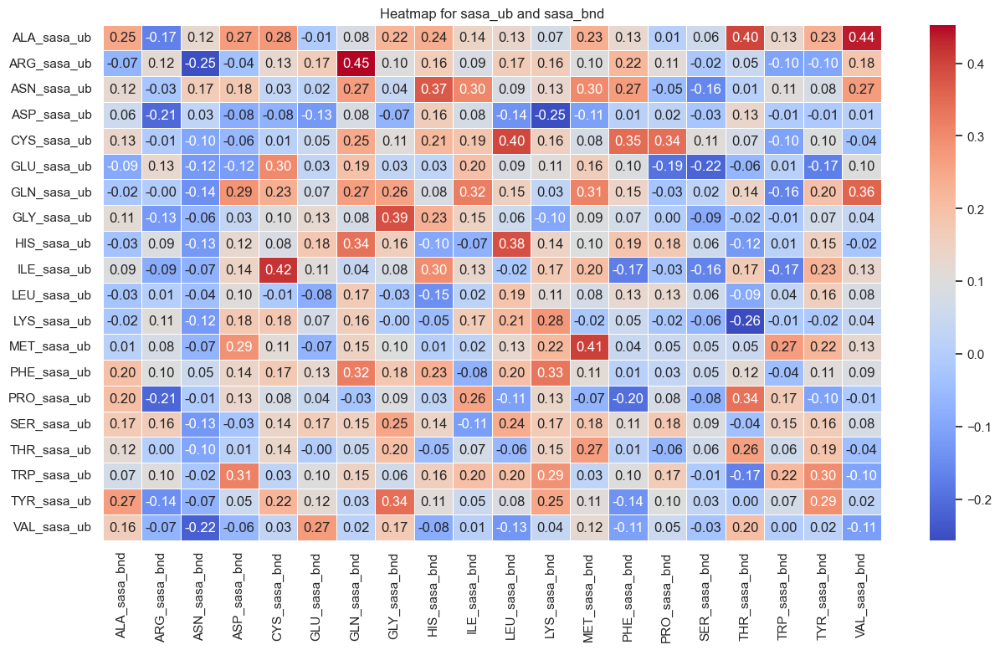

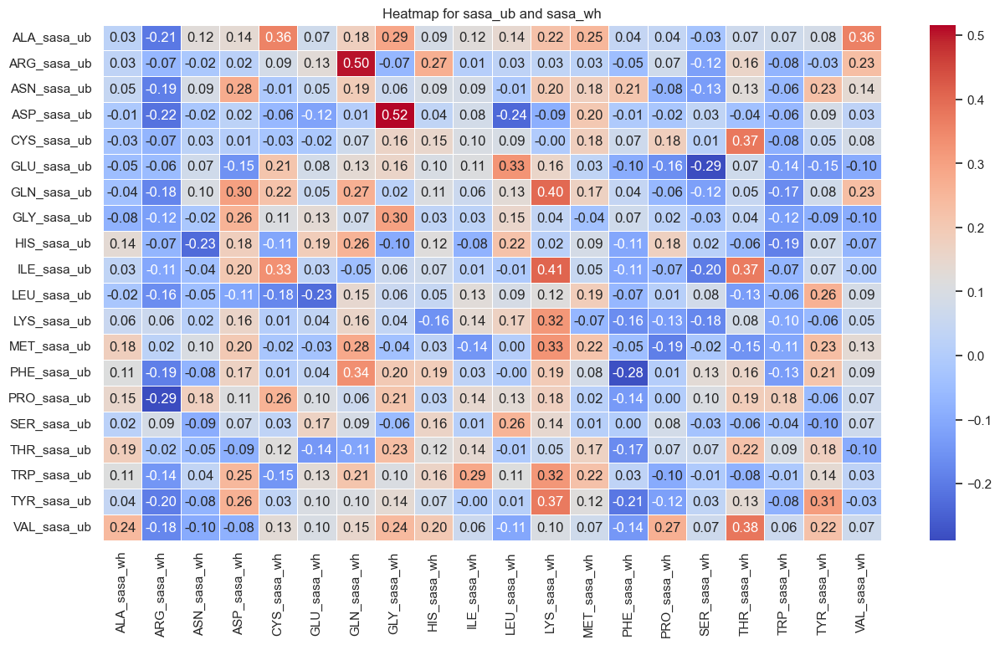

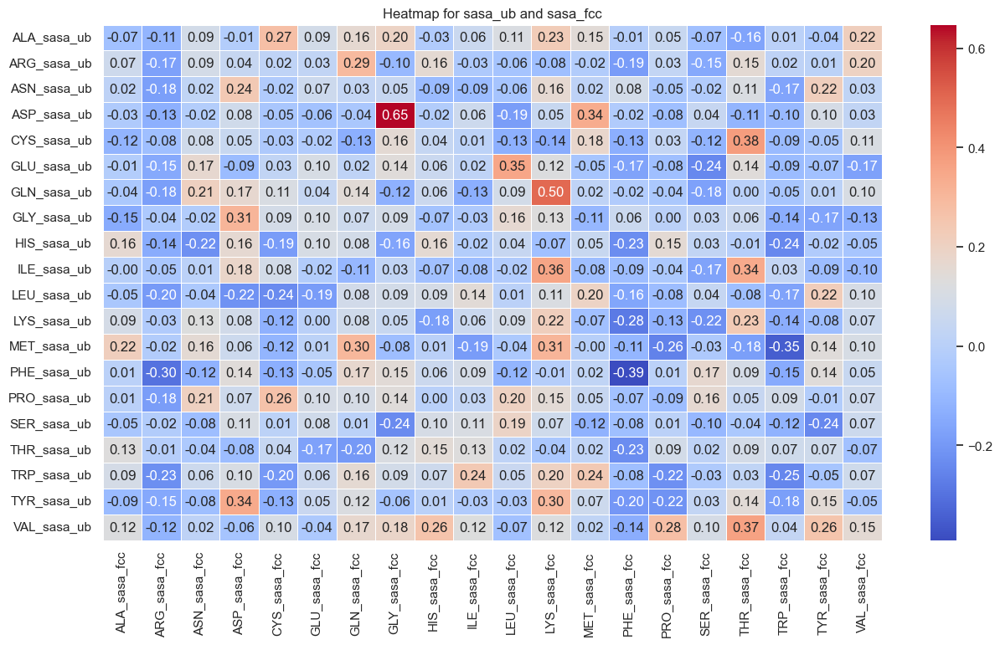

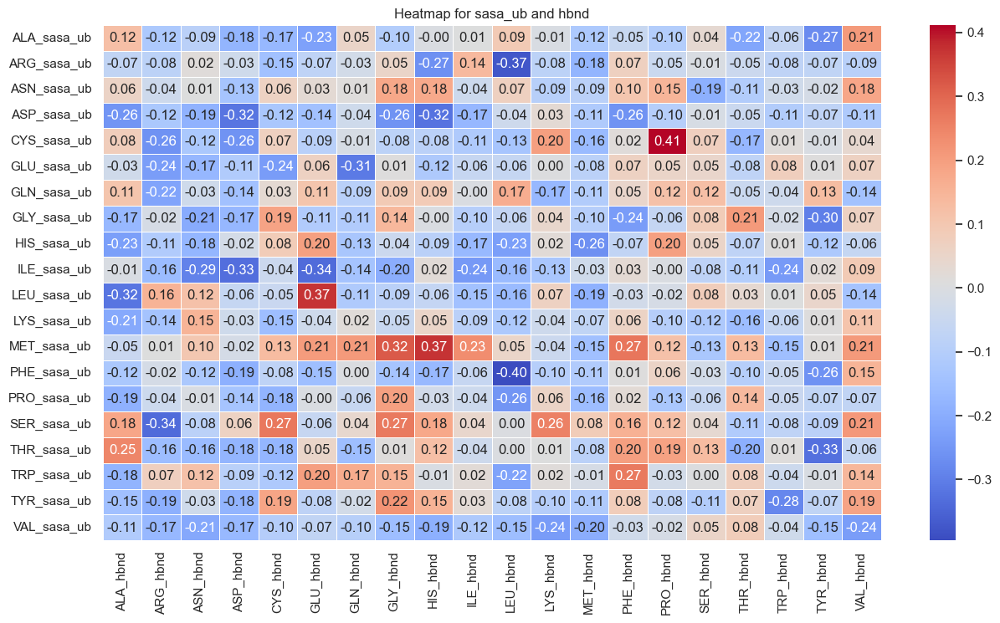

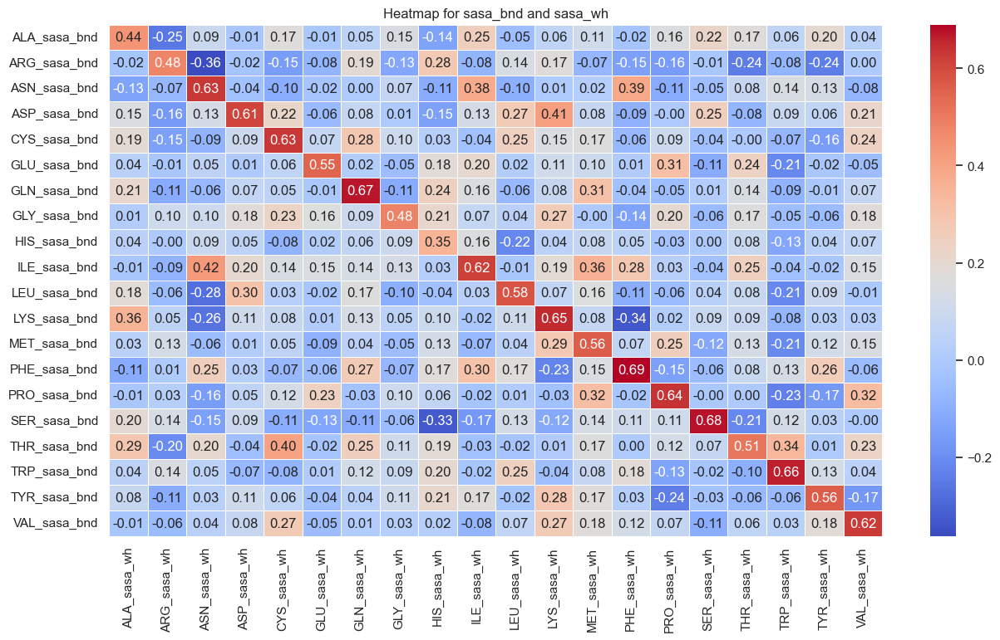

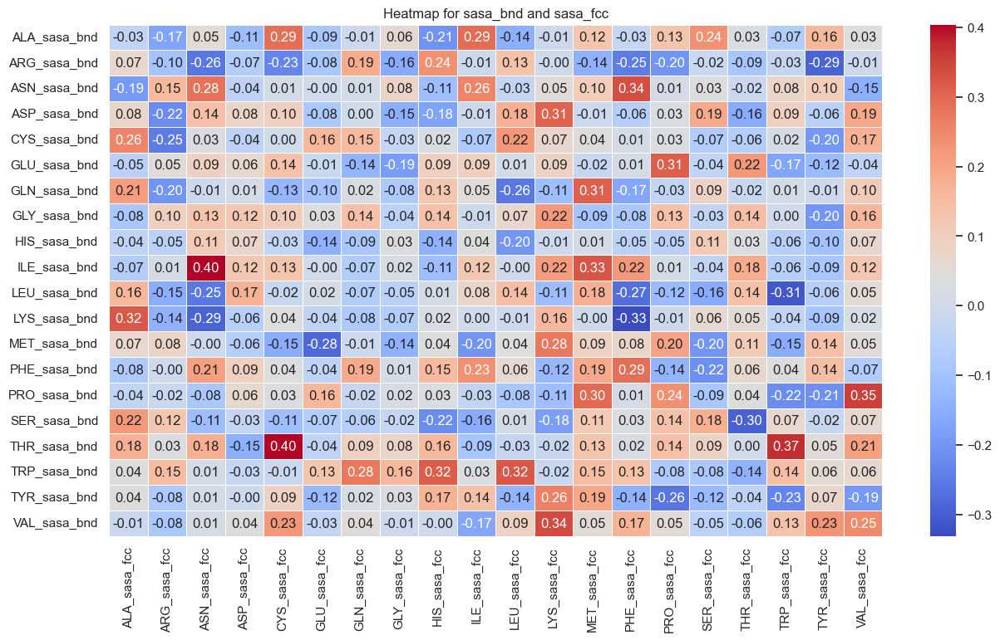

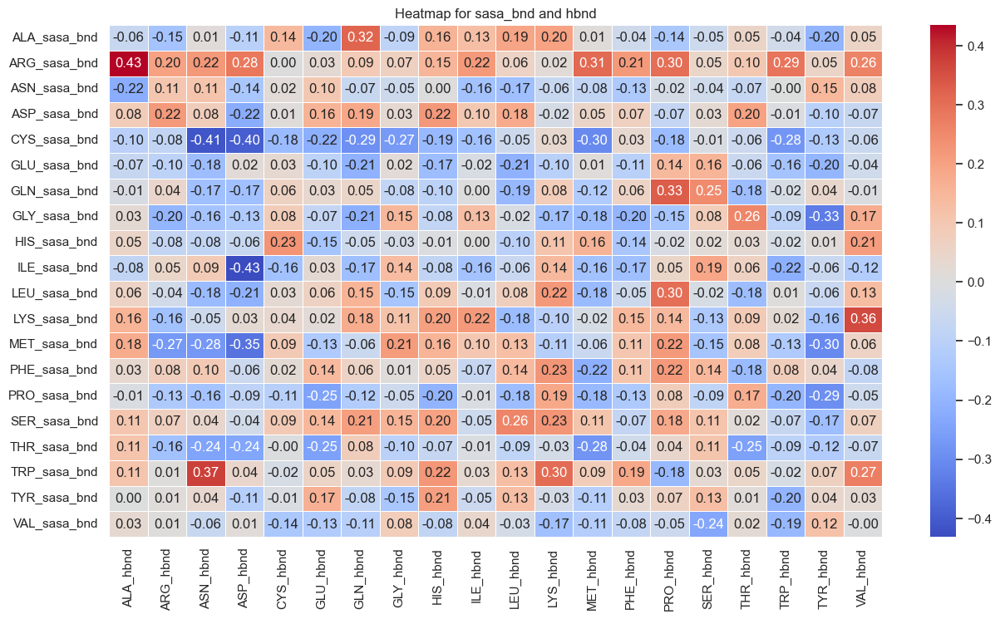

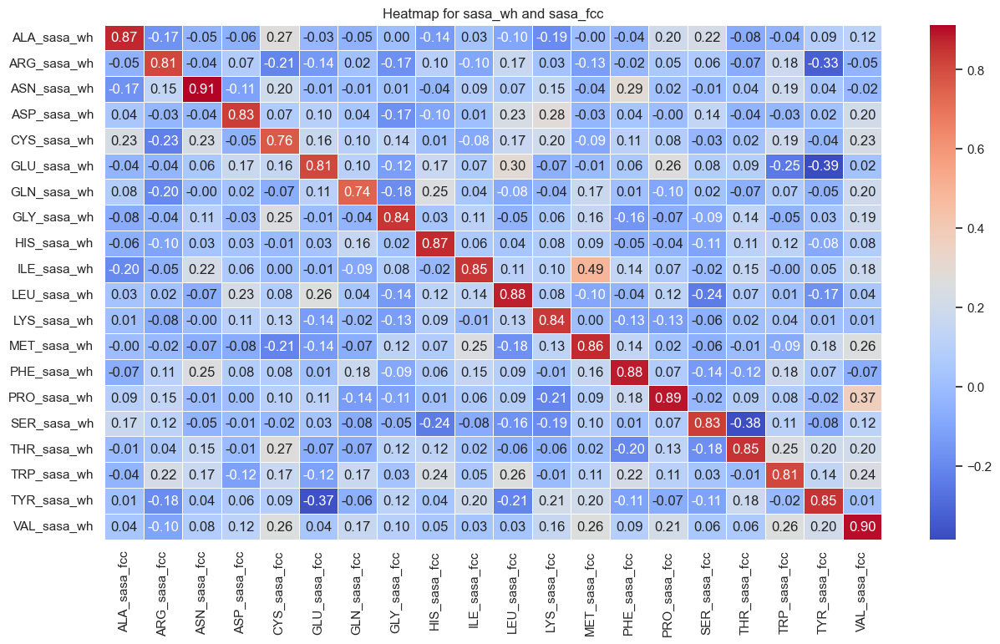

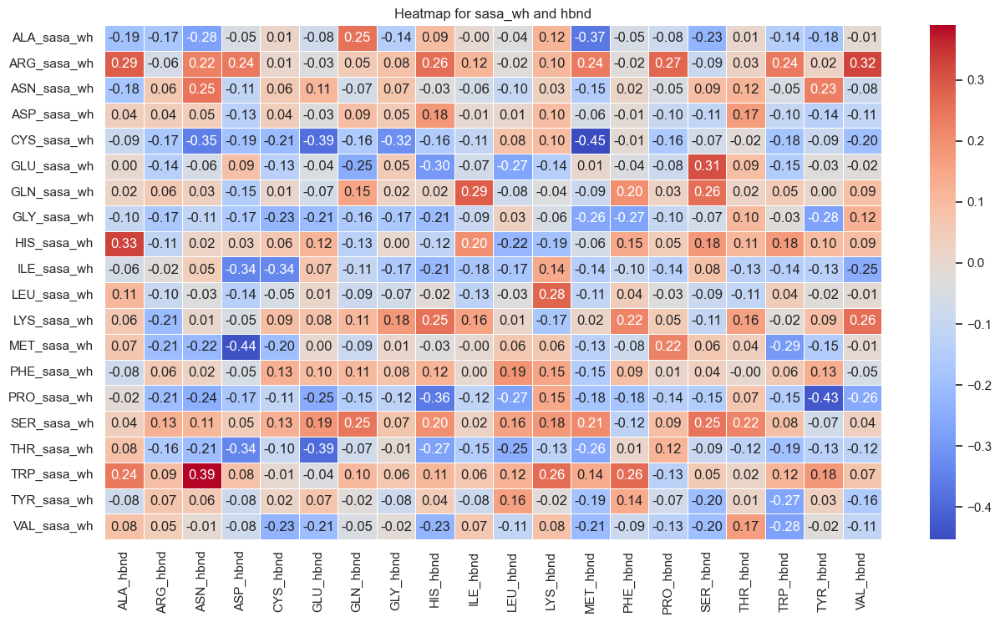

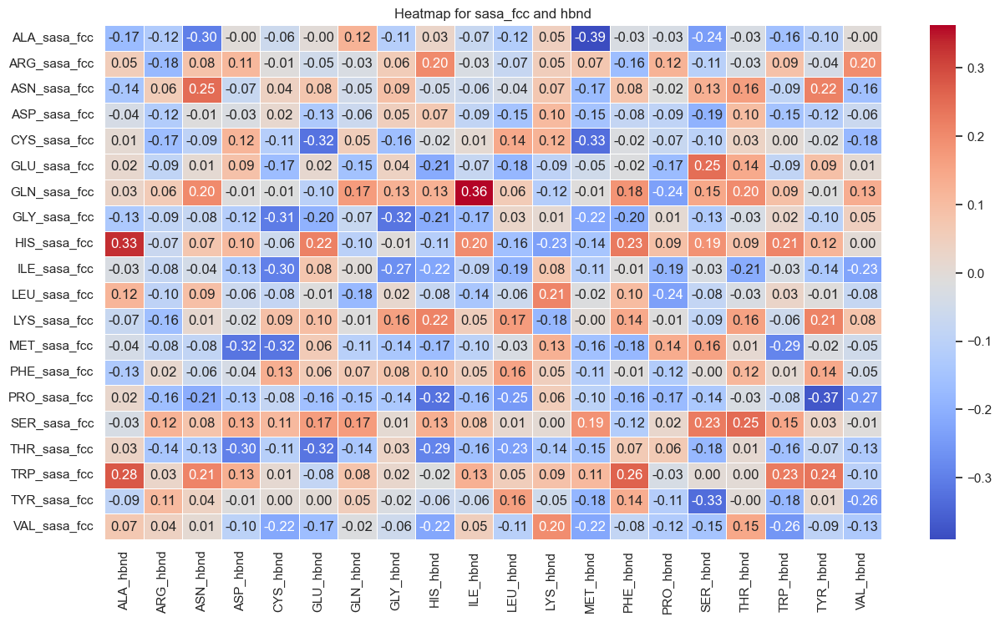

In [27]:
# Set the style of seaborn
sns.set(style="white")

# Loop through each pair of feature groups
for pair in itertools.combinations(range(0, num_sets * columns_per_feature, columns_per_feature), 2):
    feature_group1_index, feature_group2_index = pair
    feature_group1 = df.iloc[:, feature_group1_index:feature_group1_index + columns_per_feature]
    feature_group2 = df.iloc[:, feature_group2_index:feature_group2_index + columns_per_feature]

    # Calculate the correlation matrix between the two feature groups
    correlation_matrix = pd.concat([feature_group1, feature_group2], axis=1).corr()

    # Plot heatmap for correlations between feature groups
    plt.figure(figsize=(15, 8))
    sns.heatmap(correlation_matrix.iloc[:columns_per_feature, columns_per_feature:],
                cmap="coolwarm",
                annot=True,
                fmt=".2f",
                linewidths=.5
               )
    plt.title(f"""Heatmap for
 {feature_group1.columns[0][(feature_group1.columns[0].find('_')+1):]} and
 {feature_group2.columns[0][(feature_group2.columns[0].find('_')+1):]}""".replace('\n','')
             )
    plt.show()

**Notes to keep in mind:**
- LOWER SASA is better, shows that the protein is more strongly bonded (Busra please confirm)
- HIGHER hydrogen bond count is better, shows there are more bonds meaning stronger connection (ditto, please confirm)
- What each table means:
    - SASA_NB: SASA data for non-bonded protein
    - SASA_BND: SASA data for bonded protein
    - SASA_WH: SASA data for bonded proteins entire surface (2 proteins)
    - SASA_FCC: ???
    - HBND: Number of Hydrogen Bonds of the mutated protein

**Correlation results:**
- For SASA-SASA pairings: I have no clue, what can we know from SASA and SASA?
- For SASA-HBOND parings: The more negative correlation actually is better, we want HIGH hydrogen bond count and LOW SASA data.
    - Positive correlation means either high hydrogen-high sasa or low hydrogen-low sasa. This is not useful.
    - Negative correlation means high hydrogen-low sasa/low hydrogen-high sasa. This is usable data.

In [28]:
otw_binding_df = otw_binding_df.fillna(0)
otw_binding_df.head()

,ALA,ARG,ASN,ASP,CYS,GLU,GLN,GLY,HIS,ILE,LEU,LYS,MET,PHE,PRO,SER,THR,TRP,TYR,VAL
1,-0.2101,-0.23700,-0.01127,0.1178,0.05745,0.10960,0.00000,-0.10040,-0.06150,-0.06040,-0.1255,-0.13380,-0.16610,-0.25560,-0.17520,-0.09686,-0.12380,-0.16450,-0.1423,-0.01975
2,-0.5327,0.42440,0.15390,3.1970,-0.14580,2.56400,0.24390,0.39110,-0.03647,0.89090,0.2211,0.52040,0.38220,0.06194,-0.04813,-0.30740,-0.27400,0.01731,0.0000,0.72750
3,0.2862,0.06292,0.31290,0.2787,0.27520,0.29270,0.13690,0.42810,0.25470,0.09477,-0.1398,0.00000,0.09856,0.25520,0.64380,0.26250,0.19110,0.14320,0.2522,0.08689
4,0.4051,1.53900,-0.67030,3.6460,0.23230,1.79300,0.48630,0.76090,0.56000,1.09000,0.0000,1.14900,0.72830,0.55370,3.67000,-0.02119,-0.16240,1.90400,1.4990,0.28370
5,0.3291,0.05287,0.21950,0.3245,0.22610,0.01604,0.03691,-0.07146,0.03814,0.00000,-0.1329,0.06214,0.23690,-0.07075,1.76400,0.28180,0.04241,-0.04274,-0.1564,0.11190


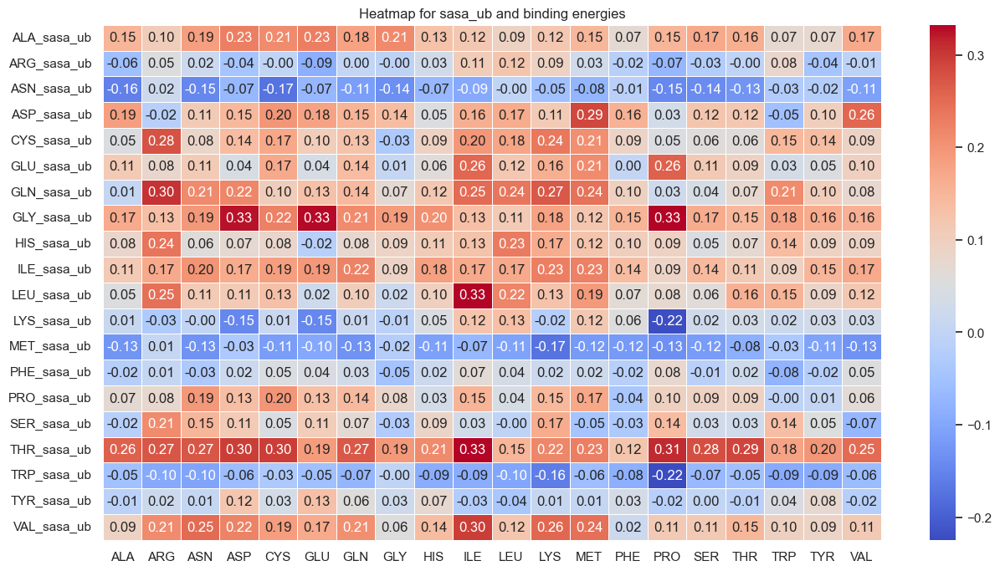

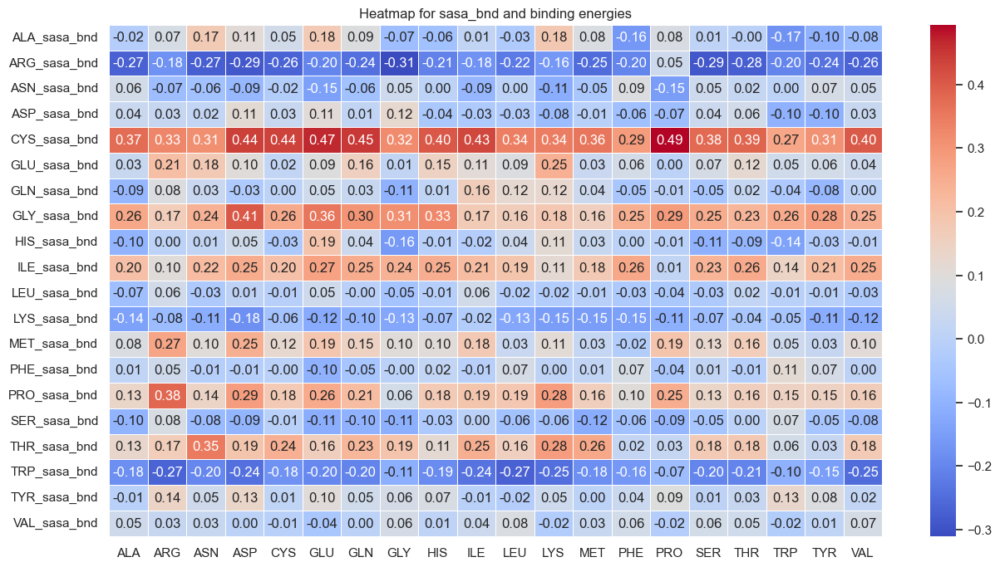

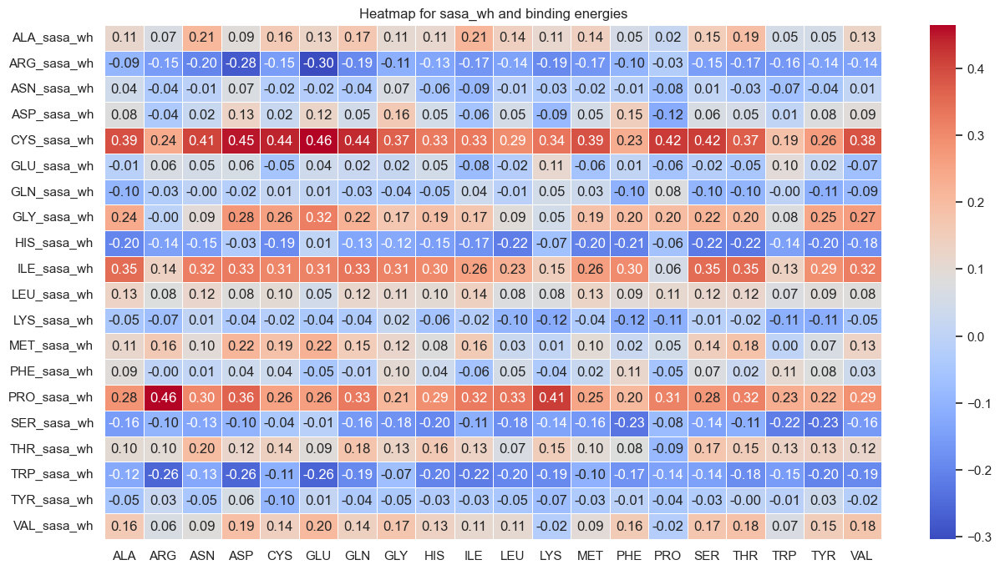

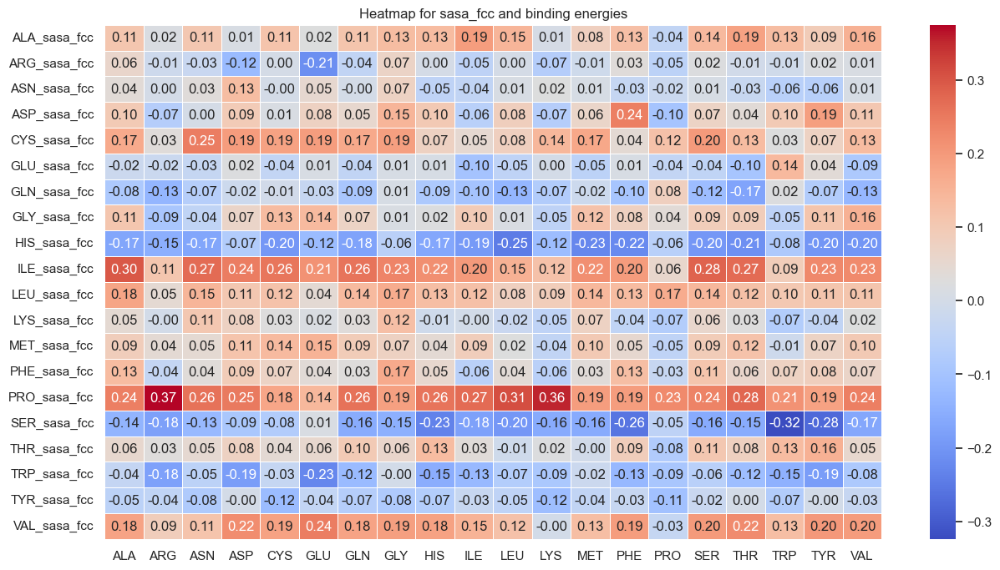

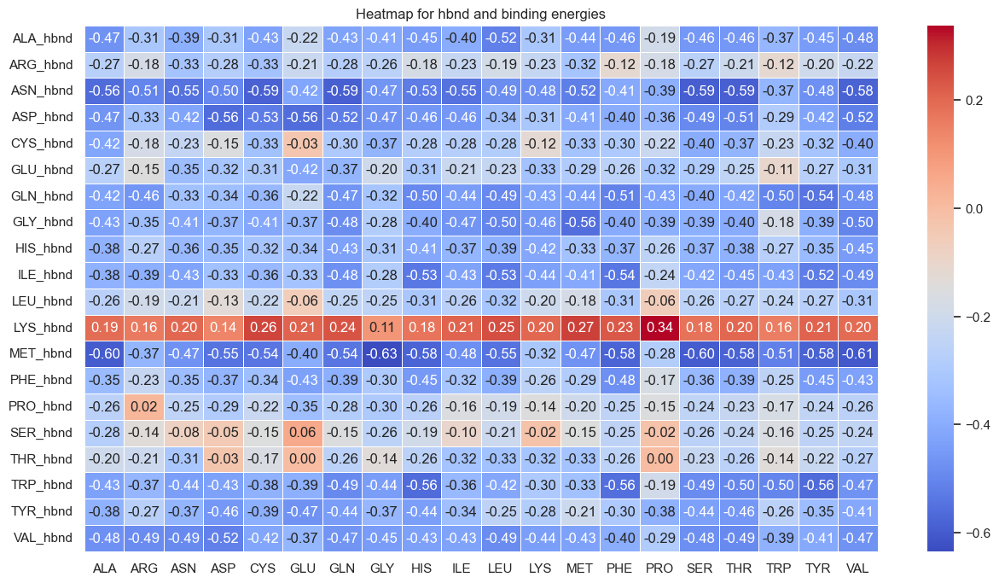

In [29]:
# Set the style of seaborn
sns.set(style="white")

# Loop through each pair of feature groups
for features_index in range(0, num_sets * columns_per_feature, columns_per_feature):
    feature_group = df.iloc[:, features_index:(features_index + columns_per_feature)]

    # Calculate the correlation matrix between the two feature groups
    correlation_matrix = pd.concat([feature_group, otw_binding_df], axis=1).corr()

    # Plot heatmap for correlations between feature groups
    plt.figure(figsize=(15, 8))
    sns.heatmap(correlation_matrix.iloc[:columns_per_feature, columns_per_feature:],
                cmap="coolwarm",
                annot=True,
                fmt=".2f",
                linewidths=.5
               )
    plt.title(f"""Heatmap for {feature_group.columns[0][(feature_group.columns[0].find('_')+1):]} and binding energies""")
    plt.show()

**Notes to keep in mind:**
- Higer Hydrogen bond is better
- Lower SASA is better
- Lower Binding energy is better
- So positively correlated SASA-Binding is better
- So negatively correlated HBND-Binding is better

**Interpertations:**
- We see that positive and negatively correlated SASA-Binding energy pairings are fairly evenly occuring in the results, this need to be looked into
- We see that most HBND-Binding energy pairings are negatively correlated. This is good as it shows that most mutations are perform desirably.

In [37]:
Totw_binding_df = (otw_binding_df.T).set_index([np.arange(0,20)])

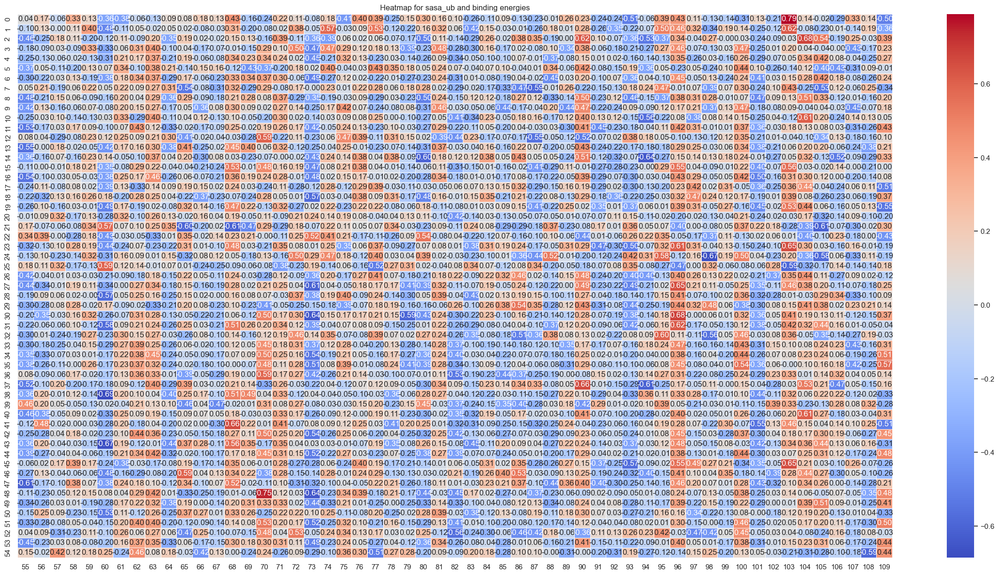

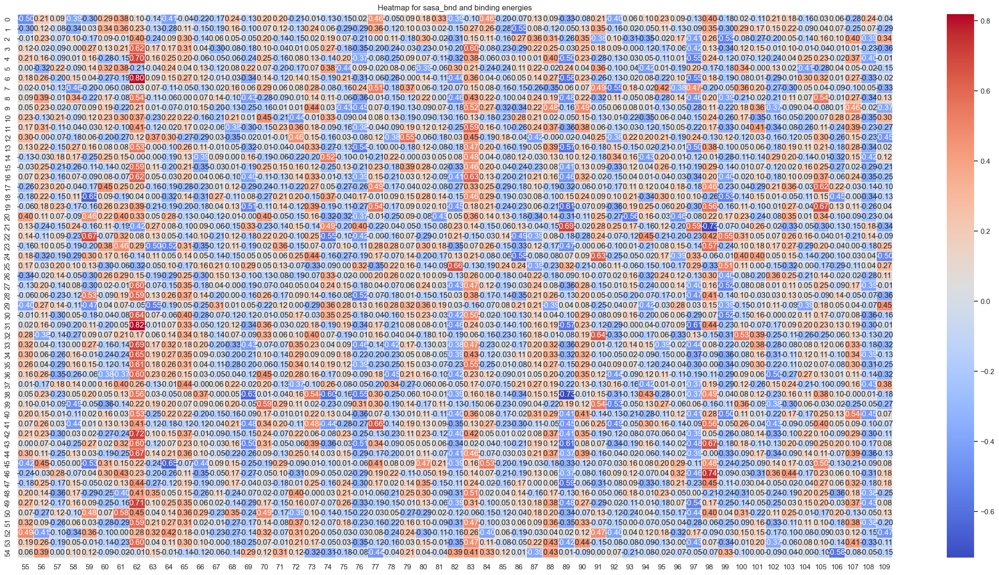

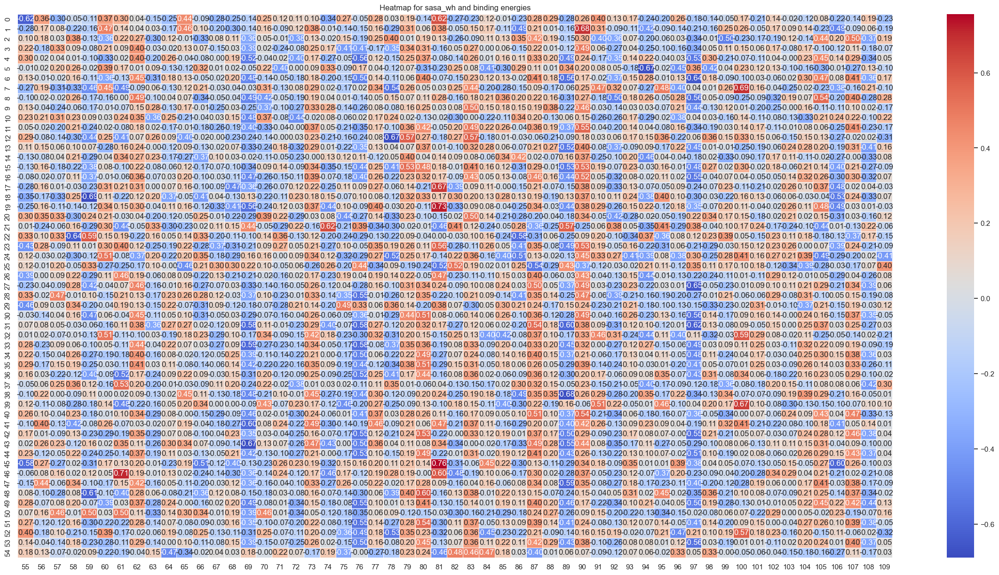

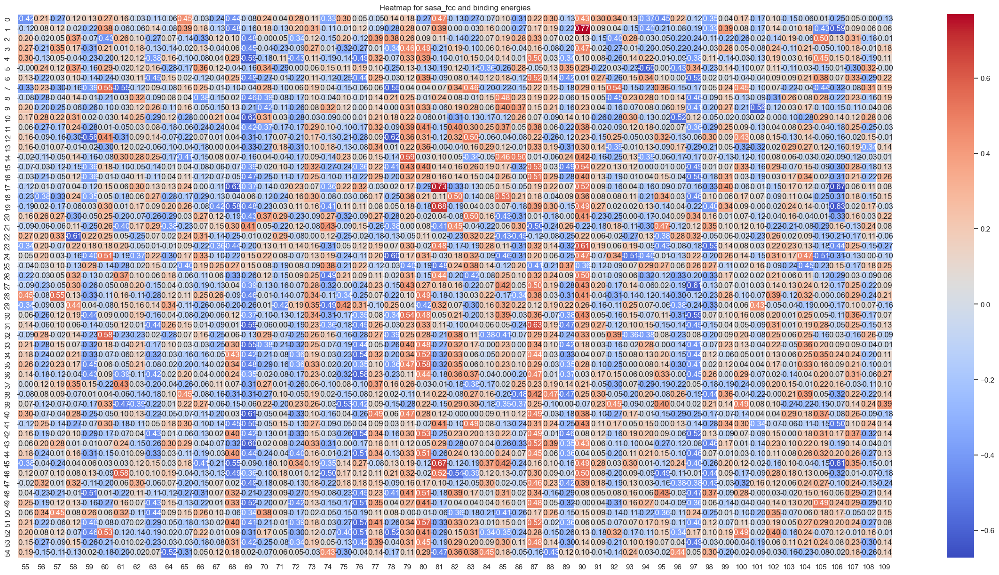

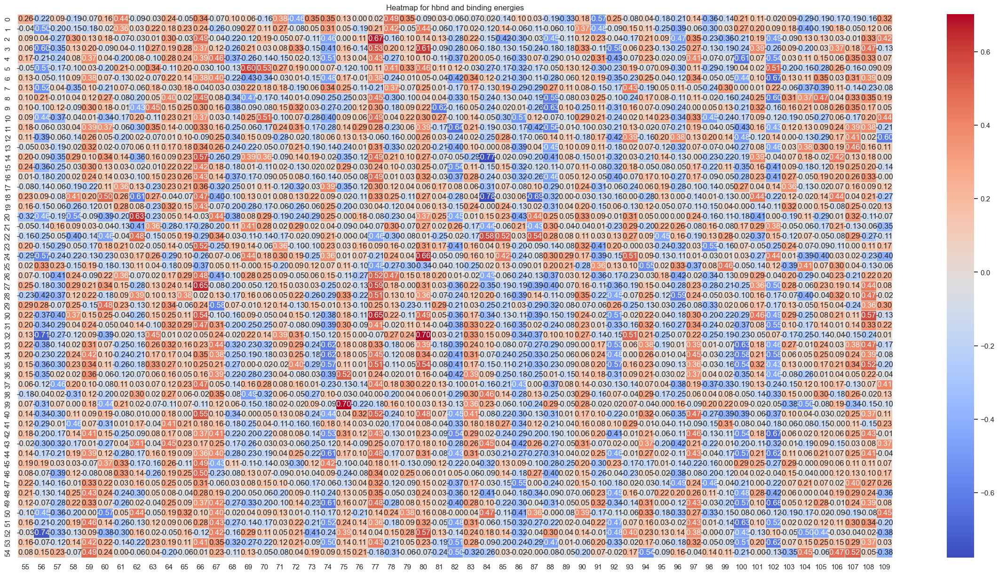

In [39]:
# DOES NOT WORK AS INTENDED
# attempting to find the correlation of mutation locations in feature space vs in label space
# (literally just the transpose version of what we just did)
# this will give us information on how much each locations mutation affects the overall protein
# but as you can see it's fucked. Please help

# Set the style of seaborn
sns.set(style="white")
rows_per_feature = otw_binding_df.shape[0]

# Loop through each pair of feature groups
for features_index in range(0, num_sets * columns_per_feature, columns_per_feature):
    feature_group = df.iloc[:, features_index:(features_index + columns_per_feature)]
    Tfeature_group = (feature_group.T).set_index([np.arange(0,20)])

    # Calculate the correlation matrix between the two feature groups
    correlation_matrix = pd.concat([Totw_binding_df,
                                    Tfeature_group],
                                   axis=1,
                                   ignore_index=True
                                  ).corr()

    # Plot heatmap for correlations between feature groups
    plt.figure(figsize=(30, 15))
    sns.heatmap(correlation_matrix.iloc[:55, 55:],
                cmap="coolwarm",
                annot=True,
                fmt=".2f",
                linewidths=.5
               )
    plt.title(f"""Heatmap for {feature_group.columns[0][(feature_group.columns[0].find('_')+1):]} and binding energies""")
    plt.show()

In [ ]:
# TODO

# TASK 1:
# normalize SASA, H bond, and Binding energy to [-1,1]
# do binding + feature and plot (optional: *5 for negatively correlated ones to emphasize them? Lets do this later)
# show # of positively correlated vs negatively correlated datapoints to show how good of a predictor it is
# (values at the top and bottom are positively correlated)

# TASK 2: (partially implemented)
# Reduce the displayed cells to only x=y. All others are garbage data. We only care about the diagonal line ([0,0], [1,1], [2,2], ...)
# DONE:
# the graphs so far find the correlation of one column vs another column in each data table.
# we should also find the correlation of one row vs another row. This will help see how each location helps affect the entire protein
# so take the transpose of each table and do the graphing process again!
# but lets do this only for binding energies, I don't wanna deal with more than 20 graphs after doing this lmao